<h2>
    <P>Lê Nguyễn Sơn Nguyên - CH1702039</P>
    <P>Phục hồi ảnh số 5</P>
</h2>

Import các thư viện cần thiết

In [1]:
import numpy as np
from skimage import color, data, restoration

import cv2
import matplotlib.pyplot as plt

In [2]:
%matplotlib inline

In [3]:
plt.rcParams['figure.dpi'] = 500

đọc và show ảnh

In [4]:
img = cv2.imread('./Anh nhieu/5n.jpg', 0)

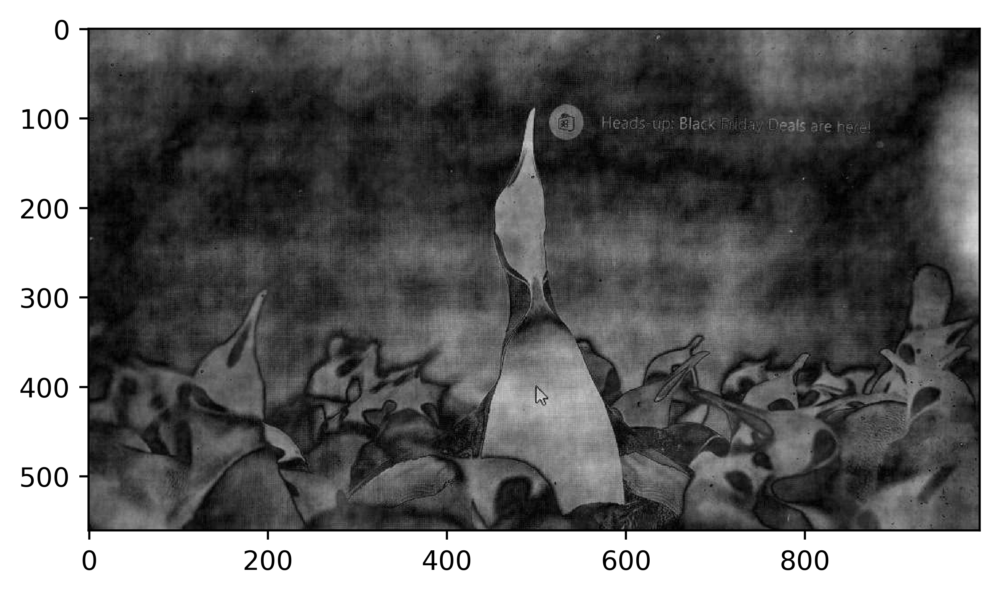

In [5]:
plt.imshow(img, cmap='gray')

vẽ histogram

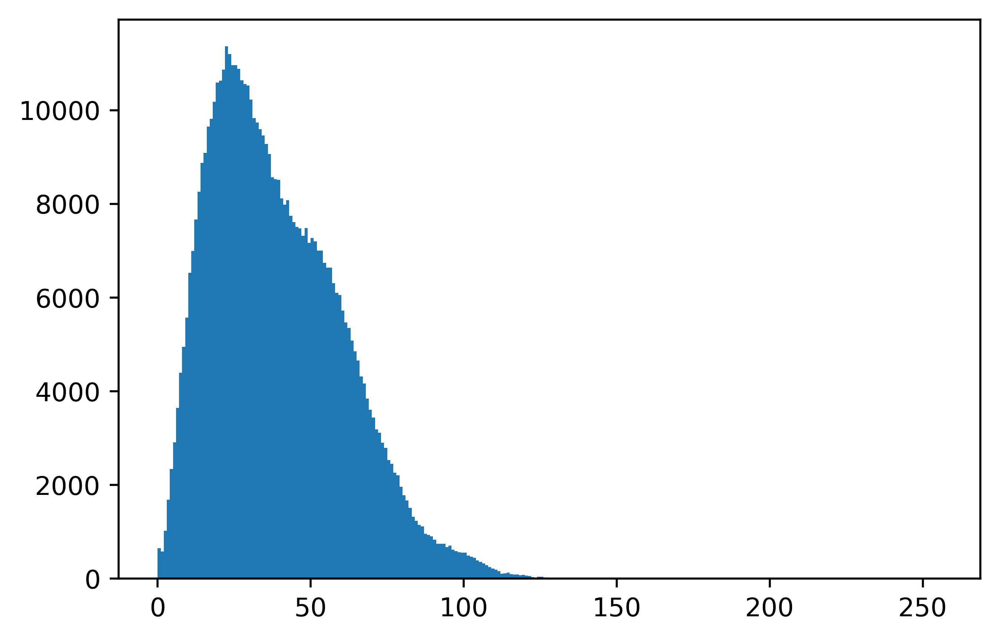

In [7]:
plt.hist(img.ravel(), 256, [0, 256])
plt.show()

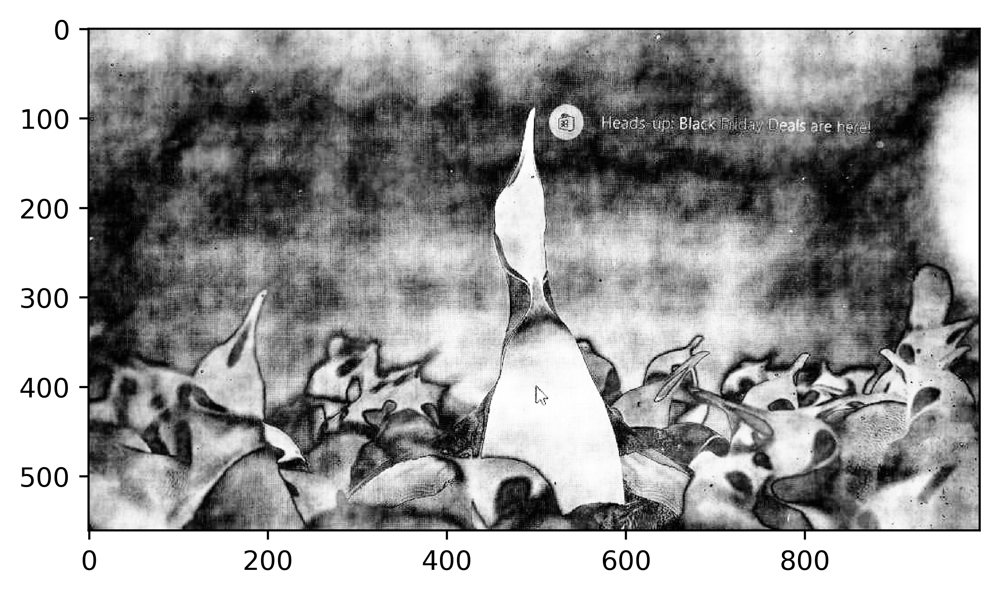

In [8]:
img_equal = cv2.equalizeHist(img)
plt.imshow(img_equal, cmap='gray')

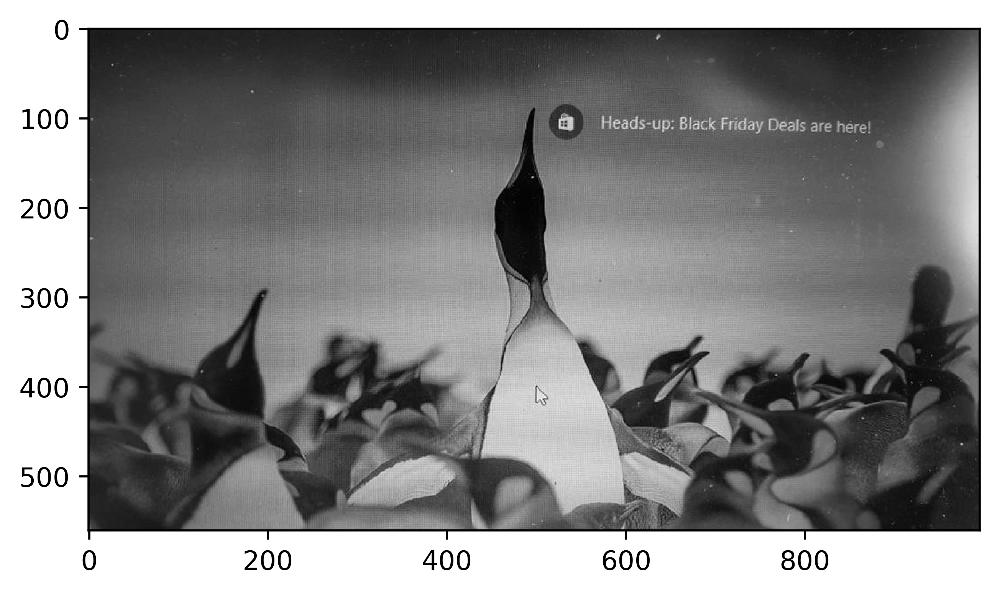

In [9]:
anh_goc = cv2.imread('./Anh nhieu/5g.jpg', 0)
plt.imshow(anh_goc, cmap='gray')

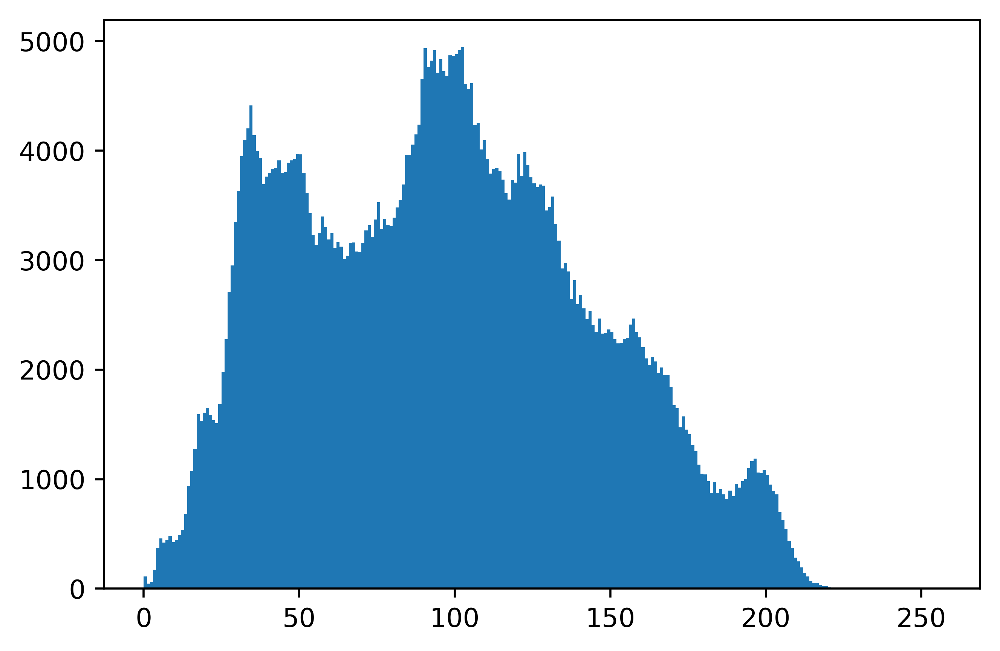

In [10]:
plt.hist(anh_goc.ravel(), 256, [0, 256])
plt.show()

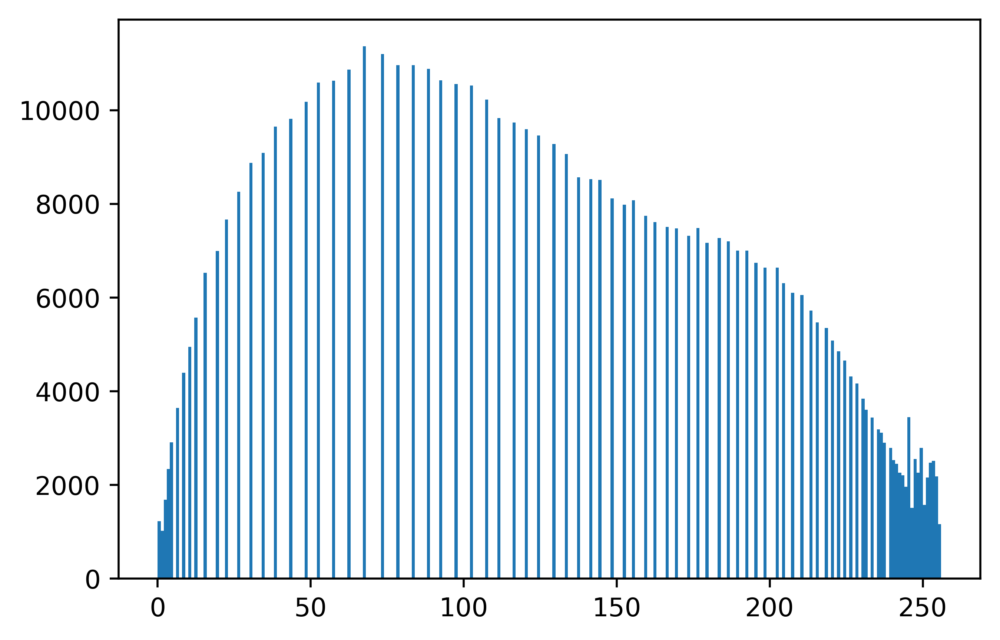

In [11]:
plt.hist(img_equal.ravel(), 256, [0, 256])
plt.show()

In [12]:
from skimage.exposure import match_histograms

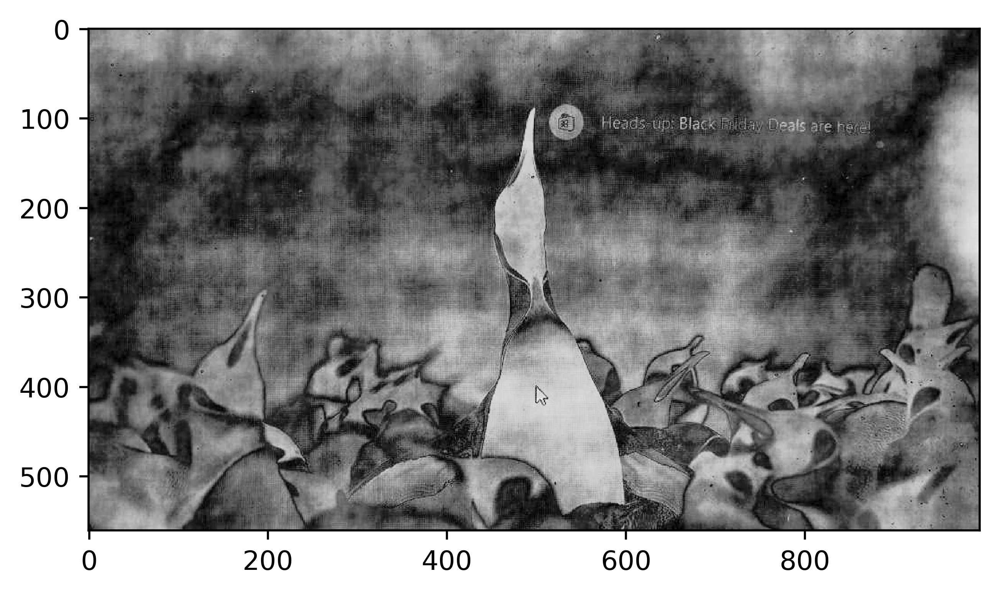

In [13]:
img_match = match_histograms(img, anh_goc, multichannel=False)
plt.imshow(img_match, cmap='gray')

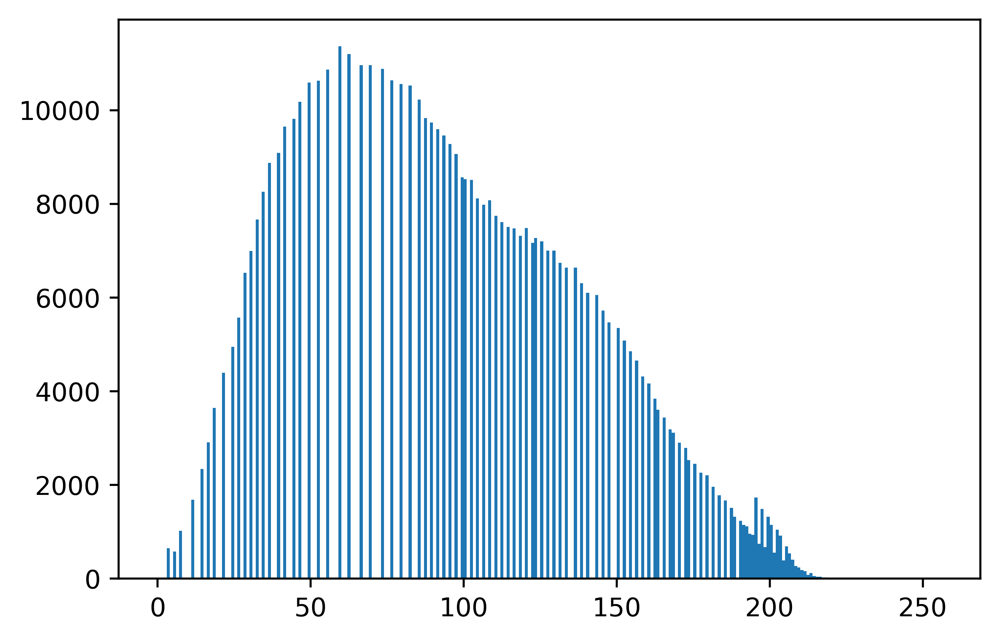

In [14]:
plt.hist(img_match.ravel(), 256, [0, 256])
plt.show()

dùng phương thức khử nhiễu gaussian có sẵn trong thư viện OpenCV

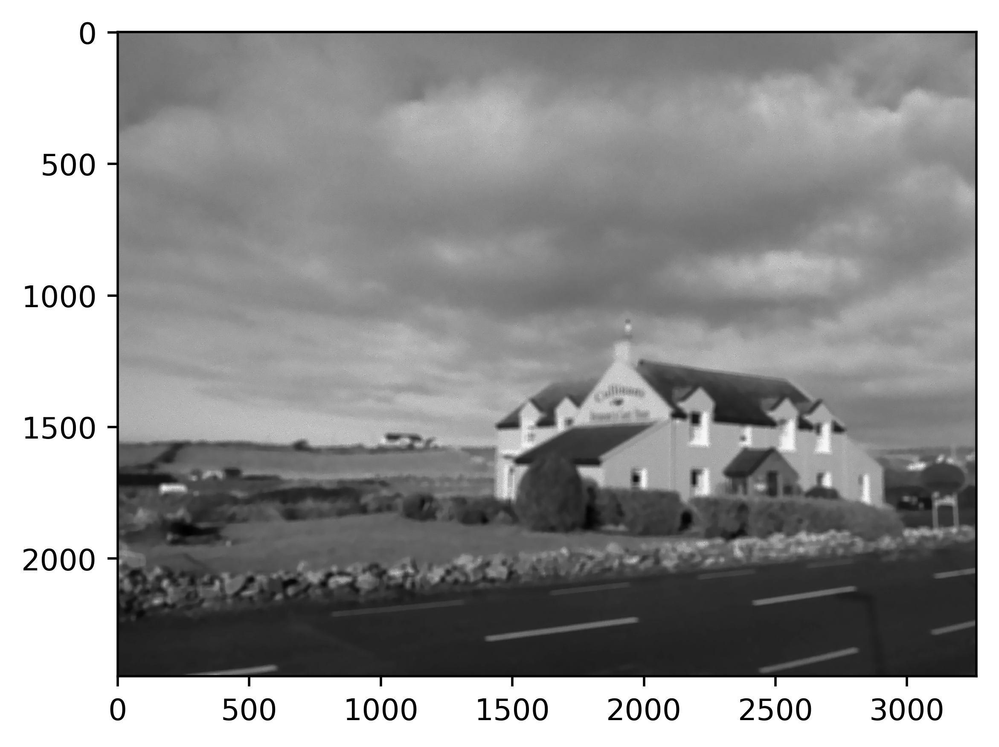

In [39]:
denoise = cv2.fastNlMeansDenoising(img, None, 9, 7, 21)
plt.imshow(denoise, cmap='gray')

In [40]:
cv2.imwrite('./noise_images/1_r_gaussian_noise.jpg', denoise)

True

đọc một kernel để deblur bằng bộ lọc wiener

In [41]:
kernel1 = cv2.imread('./kernel1.png', 0)

In [42]:
from skimage import restoration

áp dụng bộ lọc wiener với ảnh và kernel đã chọn

In [51]:
deconvolved_img = restoration.wiener(denoise, kernel1, 10000000)

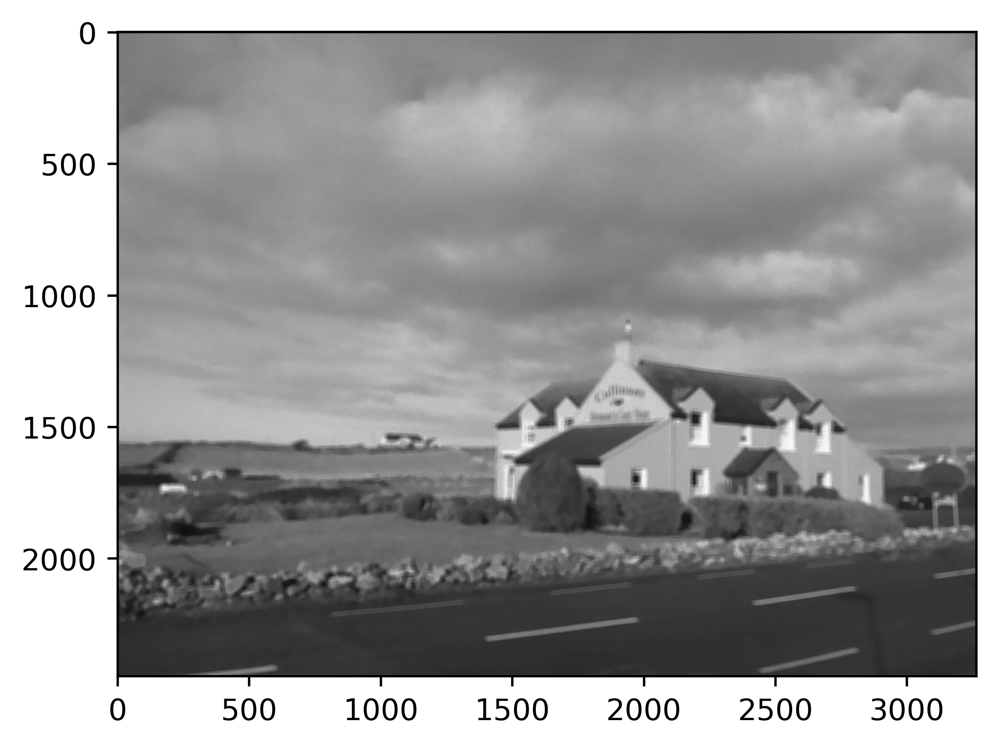

In [52]:
plt.imshow(deconvolved_img, cmap='gray')

In [53]:
import scipy.fftpack as ft

phân tích DFT ảnh trên

In [54]:
fft_r = ft.fft2(deconvolved_img)

C:\Users\baole\AppData\Roaming\Python\Python36\site-packages\scipy\fftpack\basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


In [55]:
fft_s = ft.fftshift(fft_r)

In [56]:
fft_s

array([[-1.31593748e-05+2.54482579e-17j, -1.09062037e-05-8.47677166e-06j,
         1.00420351e-05-1.00617485e-05j, ...,
         1.24078650e-05-3.55572481e-06j,  1.00420351e-05+1.00617485e-05j,
        -1.09062037e-05+8.47677166e-06j],
       [-1.16720647e-05-4.33636927e-06j,  9.71904588e-06+1.17246806e-05j,
         1.76377718e-05+2.46227198e-05j, ...,
         1.78095971e-05+1.63920724e-05j, -2.42201596e-05-1.49640403e-05j,
         1.42896668e-05-3.22491885e-06j],
       [ 2.42612025e-05+7.64322161e-06j,  7.98913671e-06-7.51647509e-06j,
        -5.87117959e-06-1.36224122e-05j, ...,
        -1.17947151e-05-8.07192865e-07j, -5.01030444e-06-9.45265603e-08j,
        -1.77172254e-05-4.03202202e-06j],
       ...,
       [-1.43293089e-05+9.50440331e-06j,  3.09887661e-05+7.08720782e-06j,
        -1.91587320e-05-2.12356747e-05j, ...,
        -5.13693654e-06+1.03145910e-06j, -8.98754311e-06+7.78013532e-06j,
        -1.61128308e-05-2.81170735e-06j],
       [ 2.42612025e-05-7.64322161e-06j, -1.

In [57]:
V, H = fft_s.shape

In [58]:
V

2448

In [59]:
H

3264

In [92]:
from PIL import Image, ImageDraw

In [93]:
image = Image.new('L', (H, V), 255)

In [94]:
draw = ImageDraw.Draw(image)

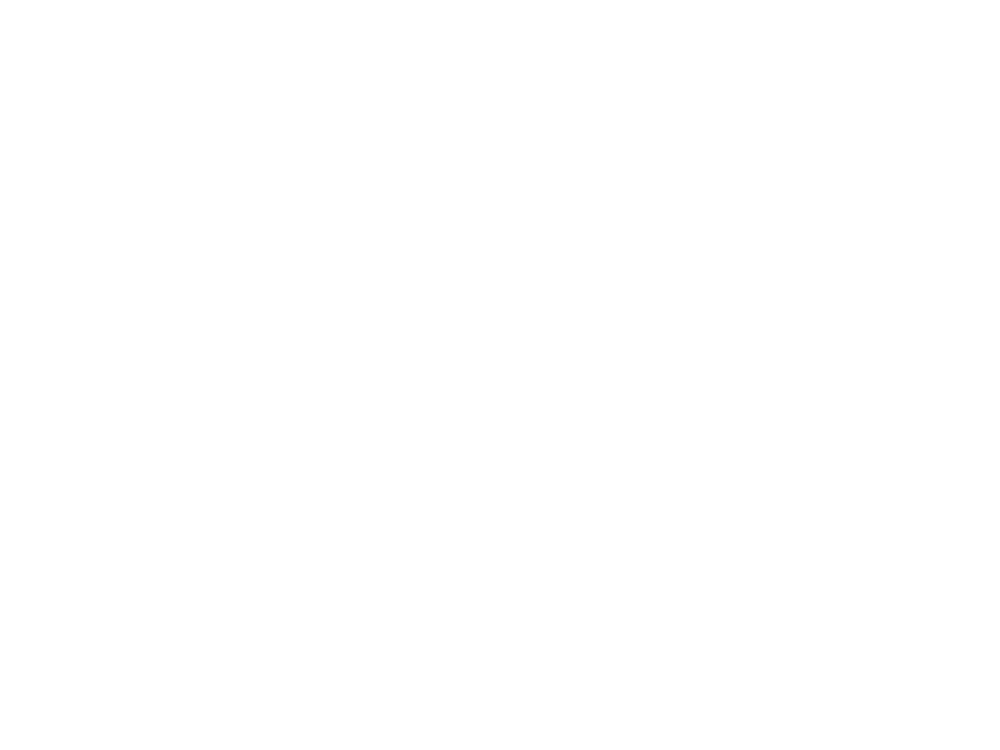

In [95]:
image

In [96]:
x, y = image.size

In [97]:
x

3264

In [98]:
y

2448

In [99]:
eX, eY = 200, 200

In [100]:
bbox = (x / 2 - eX / 2, y / 2 - eY / 2, x / 2 + eX / 2, y / 2 + eY / 2)

In [101]:
draw.ellipse(bbox, fill=0)

tạo ra một bộ lọc thông cao

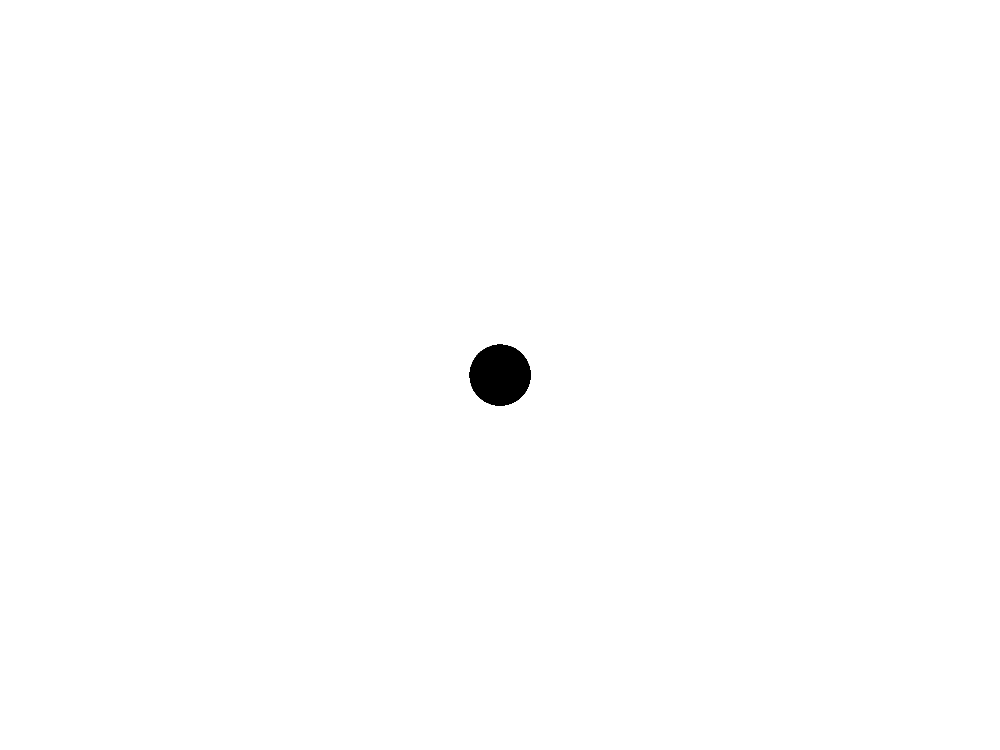

In [102]:
image

In [103]:
image = np.asarray(image)

In [104]:
image

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

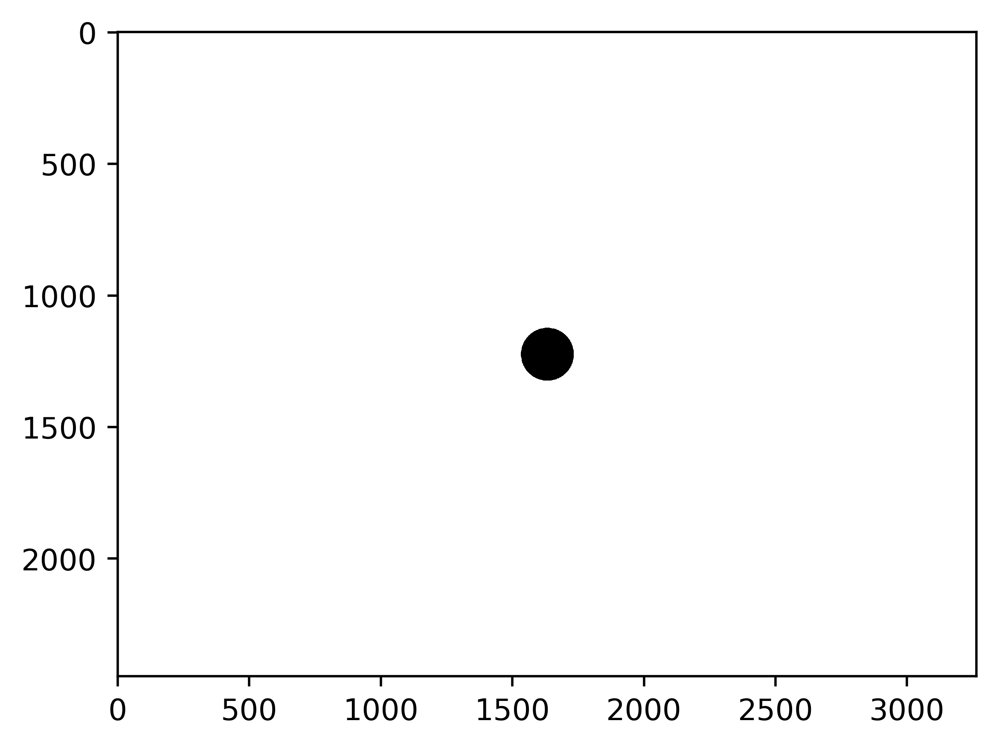

In [105]:
plt.imshow(image, cmap='gray')

In [106]:
fft_s.shape

(2448, 3264)

In [107]:
image.shape

(2448, 3264)

In [108]:
image = image / 255

In [109]:
image

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

In [110]:
fft_s

array([[-1.31593748e-05+2.54482579e-17j, -1.09062037e-05-8.47677166e-06j,
         1.00420351e-05-1.00617485e-05j, ...,
         1.24078650e-05-3.55572481e-06j,  1.00420351e-05+1.00617485e-05j,
        -1.09062037e-05+8.47677166e-06j],
       [-1.16720647e-05-4.33636927e-06j,  9.71904588e-06+1.17246806e-05j,
         1.76377718e-05+2.46227198e-05j, ...,
         1.78095971e-05+1.63920724e-05j, -2.42201596e-05-1.49640403e-05j,
         1.42896668e-05-3.22491885e-06j],
       [ 2.42612025e-05+7.64322161e-06j,  7.98913671e-06-7.51647509e-06j,
        -5.87117959e-06-1.36224122e-05j, ...,
        -1.17947151e-05-8.07192865e-07j, -5.01030444e-06-9.45265603e-08j,
        -1.77172254e-05-4.03202202e-06j],
       ...,
       [-1.43293089e-05+9.50440331e-06j,  3.09887661e-05+7.08720782e-06j,
        -1.91587320e-05-2.12356747e-05j, ...,
        -5.13693654e-06+1.03145910e-06j, -8.98754311e-06+7.78013532e-06j,
        -1.61128308e-05-2.81170735e-06j],
       [ 2.42612025e-05-7.64322161e-06j, -1.

áp dụng bộ lọc lên miền tần số

In [111]:
image1 = fft_s * image

In [112]:
image1

array([[-1.31593748e-05+2.54482579e-17j, -1.09062037e-05-8.47677166e-06j,
         1.00420351e-05-1.00617485e-05j, ...,
         1.24078650e-05-3.55572481e-06j,  1.00420351e-05+1.00617485e-05j,
        -1.09062037e-05+8.47677166e-06j],
       [-1.16720647e-05-4.33636927e-06j,  9.71904588e-06+1.17246806e-05j,
         1.76377718e-05+2.46227198e-05j, ...,
         1.78095971e-05+1.63920724e-05j, -2.42201596e-05-1.49640403e-05j,
         1.42896668e-05-3.22491885e-06j],
       [ 2.42612025e-05+7.64322161e-06j,  7.98913671e-06-7.51647509e-06j,
        -5.87117959e-06-1.36224122e-05j, ...,
        -1.17947151e-05-8.07192865e-07j, -5.01030444e-06-9.45265603e-08j,
        -1.77172254e-05-4.03202202e-06j],
       ...,
       [-1.43293089e-05+9.50440331e-06j,  3.09887661e-05+7.08720782e-06j,
        -1.91587320e-05-2.12356747e-05j, ...,
        -5.13693654e-06+1.03145910e-06j, -8.98754311e-06+7.78013532e-06j,
        -1.61128308e-05-2.81170735e-06j],
       [ 2.42612025e-05-7.64322161e-06j, -1.

In [113]:
i_shift = ft.ifftshift(image1)

In [114]:
i_fft = ft.ifft2(i_shift)

C:\Users\baole\AppData\Roaming\Python\Python36\site-packages\scipy\fftpack\basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


In [115]:
i_fft

array([[ 0.00097948+1.85454185e-17j,  0.0006103 +1.78527579e-17j,
         0.00042178+1.78405563e-17j, ...,  0.00173314+2.06385928e-17j,
         0.00167615+2.08678880e-17j,  0.00139123+1.93877928e-17j],
       [ 0.00418195-4.15700957e-18j,  0.00389919-2.95774263e-18j,
         0.00376925-2.98785134e-18j, ...,  0.0047399 -5.39367727e-18j,
         0.00471839-5.12018719e-18j,  0.00450389-4.33184553e-18j],
       [ 0.00570387+3.20842182e-19j,  0.00547558+2.27503308e-18j,
         0.00537834+1.42936533e-18j, ...,  0.00615675+2.47529475e-20j,
         0.00614561+7.02499765e-19j,  0.00596998+8.89415650e-19j],
       ...,
       [-0.00587819-9.26875033e-18j, -0.00648655-9.52383477e-18j,
        -0.00684268-8.90421128e-18j, ..., -0.00453801-8.80111160e-18j,
        -0.0047196 -9.07158518e-18j, -0.00521363-1.11242082e-17j],
       [-0.00524044-7.09419617e-19j, -0.00579631-6.75694341e-19j,
        -0.00611635-1.43257028e-18j, ..., -0.00402954-5.31321244e-19j,
        -0.00418385-1.27607614e-18j

In [116]:
image2 = np.abs(i_fft)

ảnh sau khi áp dụng bộ lọc thông cao trên miền tần số chỉ còn giữ lại các biên cạnh

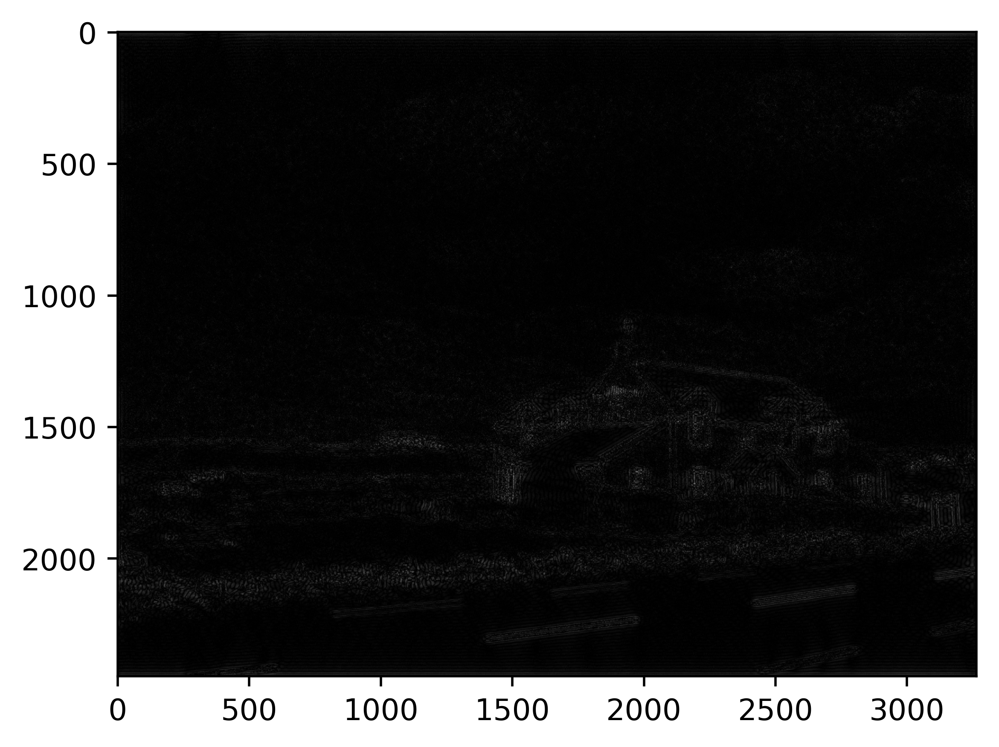

In [117]:
plt.imshow(image2, cmap='gray')

In [118]:
image2

array([[0.00097948, 0.0006103 , 0.00042178, ..., 0.00173314, 0.00167615,
        0.00139123],
       [0.00418195, 0.00389919, 0.00376925, ..., 0.0047399 , 0.00471839,
        0.00450389],
       [0.00570387, 0.00547558, 0.00537834, ..., 0.00615675, 0.00614561,
        0.00596998],
       ...,
       [0.00587819, 0.00648655, 0.00684268, ..., 0.00453801, 0.0047196 ,
        0.00521363],
       [0.00524044, 0.00579631, 0.00611635, ..., 0.00402954, 0.00418385,
        0.00463172],
       [0.00265204, 0.00312112, 0.00337985, ..., 0.0016569 , 0.00176423,
        0.0021353 ]])

In [119]:
deconvolved_img

array([[1.03661501e-02, 9.93505819e-03, 9.68799460e-03, ...,
        1.13171315e-02, 1.11933355e-02, 1.08423319e-02],
       [1.43796313e-02, 1.40371130e-02, 1.38508365e-02, ...,
        1.51291460e-02, 1.50426061e-02, 1.47639484e-02],
       [1.66912903e-02, 1.64052205e-02, 1.62536703e-02, ...,
        1.73302990e-02, 1.72558154e-02, 1.70178566e-02],
       ...,
       [1.13237478e-03, 4.55179234e-04, 3.32448369e-05, ...,
        2.68781152e-03, 2.43400008e-03, 1.86788221e-03],
       [2.53436936e-03, 1.91200005e-03, 1.52861918e-03, ...,
        3.95458710e-03, 3.72983807e-03, 3.21186064e-03],
       [5.92079384e-03, 5.38755006e-03, 5.06791661e-03, ...,
        7.11922340e-03, 6.94327126e-03, 6.50412257e-03]])

tăng cường biên cạnh cho ảnh

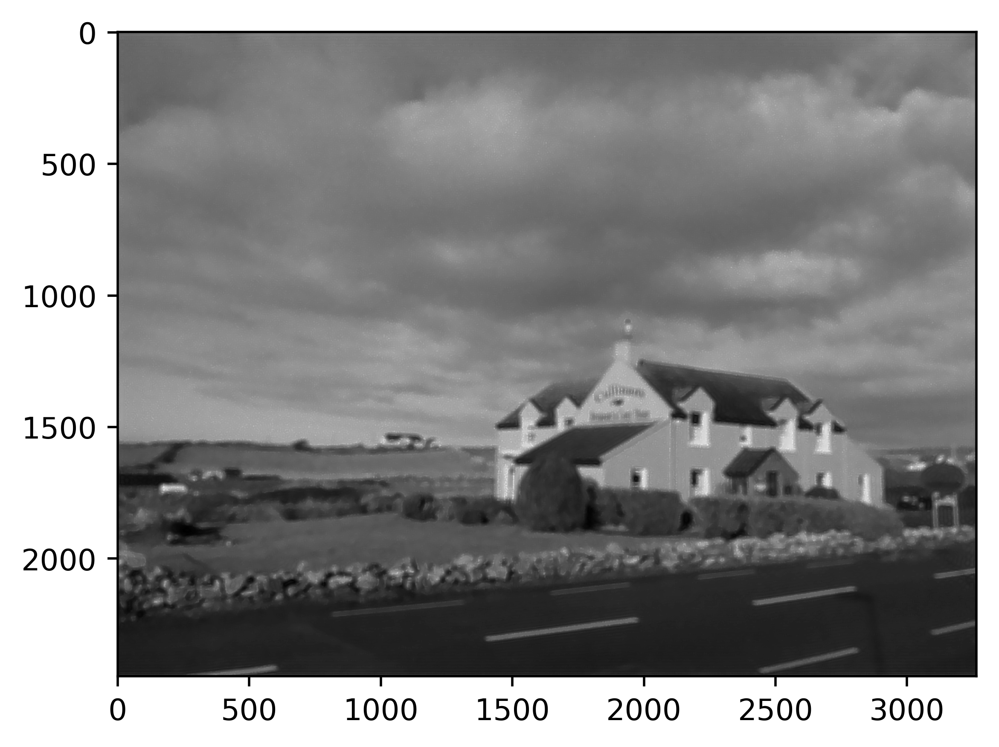

In [121]:
image3 = deconvolved_img + image2
plt.imshow(image3, cmap='gray')

save hình sau cùng

In [124]:
plt.imsave('./noise_images/hinh1restore-phienban1.jpg',
           image3,
           format='jpg',
           cmap='gray')